In [93]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
!pip install folium
import folium
import numpy as np

from geopy.geocoders import Nominatim
from sklearn.cluster import KMeans
import json # library to handle JSON files

!pip install geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
print('Libraries imported.')

Libraries imported.


In [94]:
import types
import pandas as pd
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.
client_9c92be64f7a14611b0a7039a9d7207bb = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='-3nbXAvzEojO67jGfm0eKJD-dhoo7IFu51sLr-hgXE1Z',
    ibm_auth_endpoint="https://iam.cloud.ibm.com/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url='https://s3.eu-geo.objectstorage.service.networklayer.com')

body = client_9c92be64f7a14611b0a7039a9d7207bb.get_object(Bucket='capstoneproject-donotdelete-pr-fcbsos5khnwxo8',Key='Beng.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

beng = pd.read_csv(body)
beng.head()
body = client_9c92be64f7a14611b0a7039a9d7207bb.get_object(Bucket='capstoneproject-donotdelete-pr-fcbsos5khnwxo8',Key='Beng.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

beng = pd.read_csv(body)
beng.head()
body = client_9c92be64f7a14611b0a7039a9d7207bb.get_object(Bucket='capstoneproject-donotdelete-pr-fcbsos5khnwxo8',Key='Beng.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

beng = pd.read_csv(body)
beng.head()


,location,price
0,Electronic City Phase II,39.07
1,Chikka Tirupathi,120.00
2,Uttarahalli,62.00
3,Lingadheeranahalli,95.00
4,Kothanur,51.00


In [95]:
beng.shape

(1296, 2)

In [96]:

body = client_9c92be64f7a14611b0a7039a9d7207bb.get_object(Bucket='capstoneproject-donotdelete-pr-fcbsos5khnwxo8',Key='Beng.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_2 = pd.read_csv(body)
df_data_2.head()
body = client_9c92be64f7a14611b0a7039a9d7207bb.get_object(Bucket='capstoneproject-donotdelete-pr-fcbsos5khnwxo8',Key='Beng.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_1 = pd.read_csv(body)
df_data_1.head()
address = 'Bengaluru'

geolocator = Nominatim(user_agent="bengaluru")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Bengaluru City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Bengaluru City are 12.9791198, 77.5912997.


In [97]:
from geopy.exc import GeocoderTimedOut

def do_geocode(particularaddress):
    try:
        geolocator = Nominatim(user_agent="benghous", timeout=5)
        return geolocator.geocode(str(neigh)+',Bengaluru')
    except GeocoderTimedOut:
        return do_geocode(particularaddress)

In [98]:
# define the dataframe columns
column_names = ['location', 'Latitude', 'Longitude'] 

# instantiate the dataframe
house = pd.DataFrame(columns=column_names)

In [99]:
lis=[]
for neigh in beng['location']:
    location = do_geocode(str(neigh)+',Bengaluru')
    district=beng.loc[beng['location']==neigh]
    if location != None:
        lis.append([neigh, location.raw['lat'], location.raw['lon']])
    else:
        lis.append([neigh, 12.9791198, 77.5912997])  
    print('.', end=' ')


. . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . 

In [100]:
cols=['location','latitude','longitude']
fin=pd.DataFrame(lis,columns=cols)

In [101]:
fin.to_csv('final.csv')

In [102]:
result = pd.merge(fin, beng , on='location')
result.to_csv('coordi.csv')

In [103]:
map_beng = folium.Map(location=[12.9791198, 77.5912997], zoom_start=11, tiles='stamenterrain')
for lat, lng, neighborhood in zip(result['latitude'], result['longitude'], result['location']):
    lat=float(lat)
    lng=float(lng)
    label = neighborhood 
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_beng)  
    
map_beng

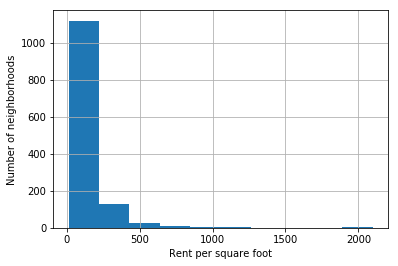

In [104]:


result['price'].hist()

plt.xlabel('Rent per square foot')
plt.ylabel('Number of neighborhoods')
plt.show()



In [109]:
CLIENT_ID = 'SRO2Z4155RMQ0RAUM4AE03G2B1ZWGA1PSLIWXPPEE3QZA4YQ' # your Foursquare ID
CLIENT_SECRET = 'Q0K5XMTR3YWECIJAMWKHESTIAR2Y3X0HINN2KG4Z0RKEV4MD' # your Foursquare Secret
VERSION = '20200727' # Foursquare API version

print('Your credentials:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentials:
CLIENT_ID: SRO2Z4155RMQ0RAUM4AE03G2B1ZWGA1PSLIWXPPEE3QZA4YQ
CLIENT_SECRET:Q0K5XMTR3YWECIJAMWKHESTIAR2Y3X0HINN2KG4Z0RKEV4MD


In [106]:
import json
from pandas.io.json import json_normalize
import requests

In [110]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

    
def getNearbyVenues(names,latitudes, longitudes, radius=300, LIMIT=100):
    
    venues_list=[]
    i=0
    for name, lat, lng in zip(names, latitudes, longitudes):
        i=i+1
        print(i)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT) # We set an upper limit of 100 venues for each neighborhood.
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
         # return only relevant information for each nearby venue
        venues_list.append([(
            name,
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood',
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [111]:
beng_venues = getNearbyVenues(names=result['location'],
                                   latitudes=result['latitude'],
                                   longitudes=result['longitude']
                                  )

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [112]:
beng_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Electronic City Phase II,12.8468545,77.6769267,Ambareesh Caterers,12.846699,77.676923,Restaurant
1,Electronic City Phase II,12.8468545,77.6769267,Master Chef Party Catering Bangalore,12.846678,77.676301,Food Truck
2,Electronic City Phase II,12.8468545,77.6769267,TCS Think Campus,12.847598,77.679138,Coworking Space
3,Electronic City Phase II,12.8468545,77.6769267,Badminton Court,12.847868,77.679278,Playground
4,Electronic City Phase II,12.8468545,77.6769267,Infosys Food Court GHS,12.846075,77.679440,Food Court


In [113]:
beng_venues.shape

(4557, 7)

In [114]:
beng_venues.to_csv('bengvenues.csv')

In [115]:
len(beng_venues['Neighborhood'].value_counts())

1096

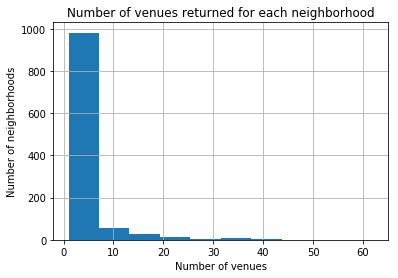

In [116]:
beng_venues.groupby('Neighborhood').count().sort_values('Venue').Venue.hist()

plt.title('Number of venues returned for each neighborhood')
plt.xlabel('Number of venues')
plt.ylabel('Number of neighborhoods')
plt.show()

In [117]:
beng_onehot = pd.get_dummies(beng_venues[['Venue Category']], prefix="", prefix_sep="")
beng_onehot.drop('Neighborhood' , axis='columns', inplace=True)
# add neighborhood column back to dataframe
beng_onehot.insert(0, "Neighborhood", beng_venues['Neighborhood'], True) 

beng_onehot.loc[beng_onehot['Indian Restaurant']==1, :]

,Neighborhood,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,American Restaurant,Andhra Restaurant,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Australian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Badminton Court,Bagel Shop,Bakery,Bar,Basketball Court,Bed & Breakfast,Beer Bar,Beer Garden,Bengali Restaurant,Bistro,Boarding House,Bookstore,Border Crossing,Boutique,Bowling Alley,Boxing Gym,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Capitol Building,Caribbean Restaurant,Castle,Chaat Place,Cheese Shop,Chinese Restaurant,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Arts Building,Comfort Food Restaurant,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cricket Ground,Cupcake Shop,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Event Space,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Financial or Legal Service,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Gourmet Shop,Grocery Store,Gym,Gym / Fitness Center,Halal Restaurant,Health & Beauty Service,Health Food Store,Historic Site,Home Service,Hookah Bar,Hospital,Hotel,Hotel Bar,Hotel Pool,Hyderabadi Restaurant,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indian Sweet Shop,Indie Movie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karnataka Restaurant,Kerala Restaurant,Kids Store,Korean Restaurant,Lake,Laundromat,Light Rail Station,Liquor Store,Lounge,Maharashtrian Restaurant,Market,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Mobility Store,Modern European Restaurant,Monument / Landmark,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multicuisine Indian Restaurant,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Nightclub,Noodle House,North Indian Restaurant,Office,Optical Shop,Outlet Store,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Planetarium,Platform,Playground,Plaza,Pool,Pool Hall,Pub,Public Art,Punjabi Restaurant,Racetrack,Rajasthani Restaurant,Record Shop,Recreation Center,Resort,Restaurant,Road,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,South Indian Restaurant,Southern / Soul Food Restaurant,Spa,Sporting Goods Shop,Sports Bar,Sports Club,Stadium,Steakhouse,Supermarket,Sushi Restaurant,Swim School,Swiss Restaurant,Szechuan Restaurant,Tailor Shop,Tea Room,Tennis Court,Tennis Stadium,Tex-Mex Restaurant,Thai Restaurant,Theater,Theme Restaurant,Tibetan Restaurant,Tourist Information Center,Toy / Game Store,Track Stadium,Trail,Train Station,Tram Station,Travel & Transport,Travel Agency,Tunnel,Udupi Restaurant,Vegetarian / Vegan Restaurant,Video Store,Vietnamese Restaurant,Water Park,Wine Bar,Women's Store,Yoga Studio
10,Lingadheeranahalli,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [ ]:
beng_grouped = beng_onehot.groupby('Neighborhood').mean().reset_index()
beng_grouped

In [ ]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [ ]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['location']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['location'] = beng_grouped['Neighborhood']

for ind in np.arange(beng_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(beng_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()


In [ ]:
neighborhoods_venues_sorted.shape

In [ ]:
x = neighborhoods_venues_sorted.isnull()
x['1st Most Common Venue'].value_counts()

In [ ]:
beng_grouped_clustering = beng_grouped.drop('Neighborhood', 1)

cost_list=[]
for k in range (1, 20):
 
        # Create a kmeans model on our data, using k clusters.  random_state helps ensure that the algorithm returns the same results each time.
        # the default parameters of the KMeans algorithms instruct the algorithm to run 10 times for each number of clusters
        # with different centroid initializations to ensure we avoid local minima
        kmeans_model = KMeans(n_clusters=k, random_state=1, max_iter=600).fit(beng_grouped_clustering.iloc[:, :])
 
        # These are our fitted labels for clusters -- the first cluster has label 0, and the second has label 1.
        labels = kmeans_model.labels_
        
        # Sum of distances of samples to their closest cluster center
        inertia = kmeans_model.inertia_
        print ("K:",k, "   Cost:", inertia)
        cost_list.append([k,inertia])
        
c_list=pd.DataFrame(cost_list)
c_list.columns=['k', 'cost']

plt.scatter(c_list['k'],c_list['cost'])
plt.title('Average squared distance from each point to cluster centroid')
plt.ylabel('Cost')
plt.xlabel('Number of clusters')
plt.xticks(np.arange(0, 20, step=2))
plt.show()

In [ ]:
# set number of clusters
kclusters = 5

beng_grouped_clustering = beng_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(beng_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

In [ ]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

beng_merged1 = result  #the 'result' dataset contains the coordinates and rental cost for every neighborhood

# merge beng_merged with neighborhoods_venues_sorted to add latitude/longitude and price for each neighborhood
beng_merged1 = beng_merged1.join(neighborhoods_venues_sorted.set_index('location'), on='location')

beng_merged1.fillna(5, inplace=True) #assigning cluster label '10' to the neighborhoods which didn't have any venues
beng_merged1['Cluster Labels']=beng_merged1['Cluster Labels'].astype('int64')
beng_merged1.head()



In [ ]:
beng_merged1.loc[beng_merged1['Cluster Labels'] == 0, beng_merged1.columns[[0] + list(range(5, beng_merged1.shape[1]))]]

In [ ]:
beng_merged1.loc[beng_merged1['Cluster Labels'] == 1, beng_merged1.columns[[0] + list(range(5, beng_merged1.shape[1]))]]

In [ ]:
beng_merged1.loc[beng_merged1['Cluster Labels'] == 2, beng_merged1.columns[[0] + list(range(5, beng_merged1.shape[1]))]]

In [ ]:
beng_merged1.loc[beng_merged1['Cluster Labels'] == 3, beng_merged1.columns[[0] + list(range(5, beng_merged1.shape[1]))]]

In [ ]:
beng_merged1.loc[beng_merged1['Cluster Labels'] == 4, beng_merged1.columns[[0] + list(range(5, beng_merged1.shape[1]))]]

In [ ]:
beng_merged1.loc[beng_merged1['Cluster Labels'] == 5, beng_merged1.columns[[0] + list(range(5, beng_merged1.shape[1]))]]